# Crecimiento logístico

## A priori Poisson y Gamma

Dados unos datos de crecimiento de una población a lo largo del tiempo, suponemos que esta sigue un crecimiento logístico de la siguiente manera:
$$
\frac{dx(t)}{dt} = r x \left(1-\frac{x}{K}\right), \quad x(0) = x_{0}
$$
donde $r$ es la tasa de crecimiento de la población, $K$ es la capacidad de carga del entorno donde habita la población y $x_{0}$ es la cantidad de población inicial. La solución exacta a este problema de valor inicial es:
$$
x(t) = \frac{x_0 k}{x_0 + (k-x_0)e^{-rt}}
$$
El problema inverso en cuestión intenta hallar los valores de $r$ y $K$ con base a observaciones $\{z_{\ell}\}_{\ell = 0}^{k}$ de la variable de estado $x(t,\theta)$ en los tiempos $\{t_{\ell}\}_{\ell = 0}^{k}$.

Para usar el algoritmo MHRW en este problema inverso tomamos como distribución a priori de los parámetros $r$ y $K$ a una distribución Gamma para cada uno, es decir, $r\sim \Gamma(a_r,b_r)$ y $K \sim \Gamma(a_K,b_K)$; además de esto suponemos independencia entre ambos parámetros, así, nuestra distribución a priori conjunta es:
$$
\Theta \sim \Gamma(a_r,b_r) \times \Gamma(a_K,b_K)
$$
Recordemos que la distribución Gamma $\Gamma(a,b)$ tiene función de densidad $f(x;a,b) = \frac{x^{a-1}e^{-x/b}}{\Gamma(a) b^{a}}$ para $x>0$.

Conocemos los datos $z_{\ell}$ en los tiempos $t_{\ell}$ cuando $\ell$ varía desde $1$ hasta $k$. Puesto que los datos son conteo de individuos entonces suponemos que,
$$
z_i \sim Poisson(x(t_i,\theta))
$$
donde $\theta = (r,k)$. Sea $z = (z_{1},\ldots,z_{k})$. Asumiendo que las observaciones son independientes y que además tienen una distribución Poisson entonces la función de verosimilitud es $\pi_{Z|\Theta}(z|\theta)$ es el producto de las funciones de densidad Poisson, así,
$$
\pi(z|\theta) = \Pi_{i=1}^{k} f(z_{i};x(t_{i},\theta)) = \Pi_{i=1}^{k} \frac{e^{-x(t_{i},\theta)}(x(t_{i},\theta))^{z_i}}{z_i!}
$$
Por el Teorema de Bayes tenemos que,
$$
\begin{align*}
\pi(\theta|z) &\propto \pi_{Z|\Theta}(z|\theta) \times \pi_{\Theta}(\theta) \\
& = \Pi_{i=1}^{k} \frac{e^{-x(t_{i},\theta)}(x(t_{i},\theta))^{z_i}}{z_i!} \times \Gamma(a_r,b_r) \times \Gamma(a_K,b_K)
\end{align*}
$$

## Datos generados

Construimos un ejemplo usando parámetros propuestos. Para tal construcción suponemos que la población inicial es de 20 individuos, la tasa de crecimiento es $r=0.2$ y la capacidad de carga del entorno es $K=750$ individuos. El tiempo se toma entre el momento $t=0$ y $t=60$. Se construye los datos del crecimiento de la población usando el modelo:
$$
\frac{dx(t)}{dt} = r x \left(1-\frac{x}{K}\right), \quad x(0) = x_{0}
$$
con solución:
$$
x(t) = \frac{x_0 k}{x_0 + (k-x_0)e^{-rt}}
$$
y, a esto, añadimos un ruido gaussiano con media $\mu=0$ y desviación estándar $\sigma=40$.

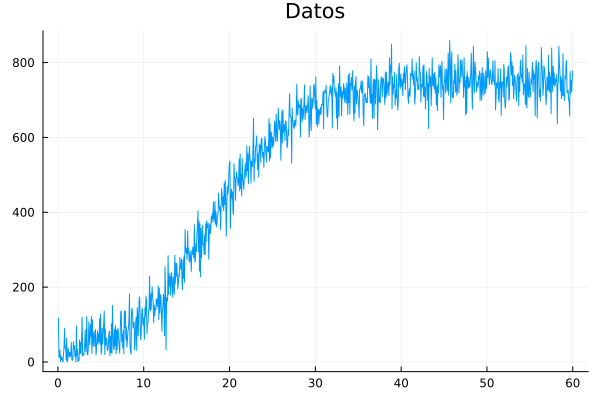

In [1]:
using Plots
using LinearAlgebra
using Distributions
using Statistics

x0 = 20  # Población inicial
r0 = 0.2 # Tasa de crecimiento
K0 = 750 # Capacidad de carga
Tiempo = (1:1000)*(60/1000)


function soln_expl(p)
    # solucion exacta de la ecuacion logistica 
    return x0 * p[2] ./ (x0 .+ (p[2] - x0) * exp.(-p[1] * Tiempo) )
end

Crecimiento = soln_expl((r0,K0)) + 40*randn(1000) #Adición de ruido
Crecimiento = Int.(floor.(abs.(Crecimiento)))

plot(Tiempo, Crecimiento,title="Datos", label=false)

Ahora construimos la función que condensa la energía entre los parámetros y los datos, es decir, la función que tiene como resultado:
$$
\begin{align*}
\pi(\theta|z) &\propto \pi_{Z|\Theta}(z|\theta) \times \pi_{\Theta}(\theta) \\
& = \Pi_{i=1}^{k} \frac{e^{-x(t_{i},\theta)}(x(t_{i},\theta))^{z_i}}{z_i!} \times \Gamma(a_r,b_r) \times \Gamma(a_K,b_K)
\end{align*}
$$
Para evitar errores numéricos tomamos el logaritmo de esta energía, y además, se realiza un escalamiento de esta función de $10^{-3}$ para controlar problemas de desbordamientos numéricos. Nótese que en el cuerpo de la función se dejan como comentarios otros modelos que se pueden asumir sobre los datos de crecimiento de la población.

In [2]:
function energy(p) # log of the posterior
    r = 1*p[1]
    k = 1000*p[2]
    noisy_data = Crecimiento
    mu = soln_expl((r,k))

    #log_likelihood = 1
    
    # negative binomial
    #omega = 2.0
    #eta = 10.0
    #r = mu ./(omega .- 1.0 .+ theta*mu)
    #q = 1.0 ./(omega .+ theta*mu)
    #log_likelihood = sum(logpdf(NegativeBinomial(r, q), noisy_data))

    # poisson
    log_likelihood = sum(logpdf.(Poisson.(mu), noisy_data))
    
    # gaussian
    #log_likelihood = sum(logpdf.(Normal.(mu, 100.0), noisy_data))
    
    log_prior = logpdf(Gamma(1,1), r) + logpdf(Gamma(1000,1), k)
    
    return (log_likelihood + log_prior)*(10^(-3))
end

energy (generic function with 1 method)

En este ejemplo se supone que $(r,k)\in[0,1]\times [0,1000]$. Para que en el algoritmo de Metropolis-Hastings sea 'más sencillo' ejecutar el camino aleatorio que seguirán los parámetros se  

In [3]:
function support(pa)
    # soporte de los parametros ""
    rt = true
    rt &= (0.0 < pa[1] < 1.0)
    rt &= (0.0 < pa[2] < 1.0)
    return rt
end

support (generic function with 1 method)

Los contornos de la función de energía son mostrados a continuación.

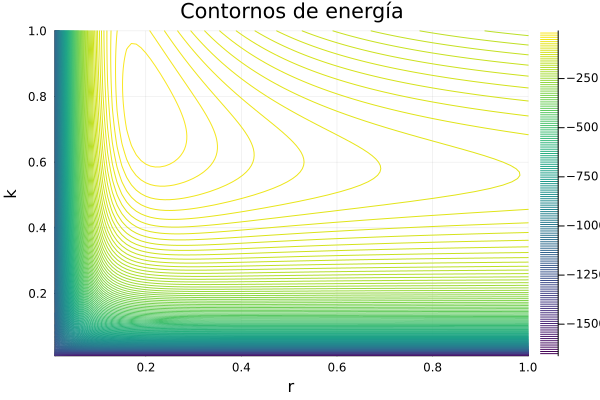

In [4]:
f(x, y) = energy((x,y))

x_range = 0.01:0.01:1
y_range = 0.01:0.01:1

# Inicializar matrices para la malla
mesh_x = zeros(length(x_range), length(y_range))
mesh_y = zeros(length(x_range), length(y_range))
# Llenar las matrices de la malla con valores de x e y
for i in 1:length(x_range)
    for j in 1:length(y_range)
        mesh_x[i, j] = x_range[i]
        mesh_y[i, j] = y_range[j]
    end
end
# Evaluar la función en cada punto de la malla
z_values = f.(mesh_y, mesh_x)

# Crear el gráfico de contornos
contour(x_range, y_range, z_values, levels=150, color=:viridis, xlabel="r", ylabel="k", title="Contornos de energía")

**Metropolis Hasting Random Walk**

En el siguiente fragmento de código se ejecuta el algoritmo de MH. Se hace una pequeña modificación para tener en cuenta la condición del soporte en que deben estar los parámetros $r$ y $K$. 

In [5]:
# Número de iteraciones
iterations = 10000
# Punto inicial donde r y K seleccionados de manera aleatoria en (0,1)
samplesED = rand(2) 

probabilitiesED = [exp(energy(samplesED[:,end]))] # energía

Alpha = [0] # tasa de aceptación
sd = 0.1 # desviación estándar del camino aleatorio

# MHRW
for i in 1:iterations
    # Construcción de nuevas muestras con un camino aleatorio normal
    theta = samplesED[:,end]+ sd*randn(2)

    # Condición del soporte
    if support(theta) == false
        alpha = 0
        p2 = exp(energy(samplesED[:,end]))
    else
        p1 = exp(energy(theta))
        p2 = exp(energy(samplesED[:,end]))
        alpha = min(1, p1/p2)
    end 
    
    Alpha = hcat(Alpha,alpha)
    u = rand()

    #Selección de muestras
    if u < alpha
        samplesED = hcat(samplesED, theta)
        probabilitiesED = hcat(probabilitiesED,p1)
    else
        samplesED = hcat(samplesED, samplesED[:,end])
        probabilitiesED = hcat(probabilitiesED,p2)
    end
end

**Muestreo sistemático**

In [6]:
initial_position = floor(100*rand())
leap = 20
samplesED_ss = samplesED[:, Int(initial_position):leap:end]
probabilitiesED_ss = probabilitiesED[Int(initial_position):leap:end];

**Estimaciones**

In [10]:
max_probED, positionED_ss = findmax(probabilitiesED_ss)
Max_likelihoodED = samplesED_ss[:, positionED_ss]
MeanED = mean(samplesED_ss, dims=2)

@show (r0,K0)
@show exp(max_probED)
@show Max_likelihoodED
@show MeanED;

(r0, K0) = (0.2, 750)
exp(max_probED) = 1.000794366929316
Max_likelihoodED = [0.19787872043977867, 0.7514949502795332]
MeanED = [0.2017550189203125; 0.7530904472552963;;]


**Gráficas**

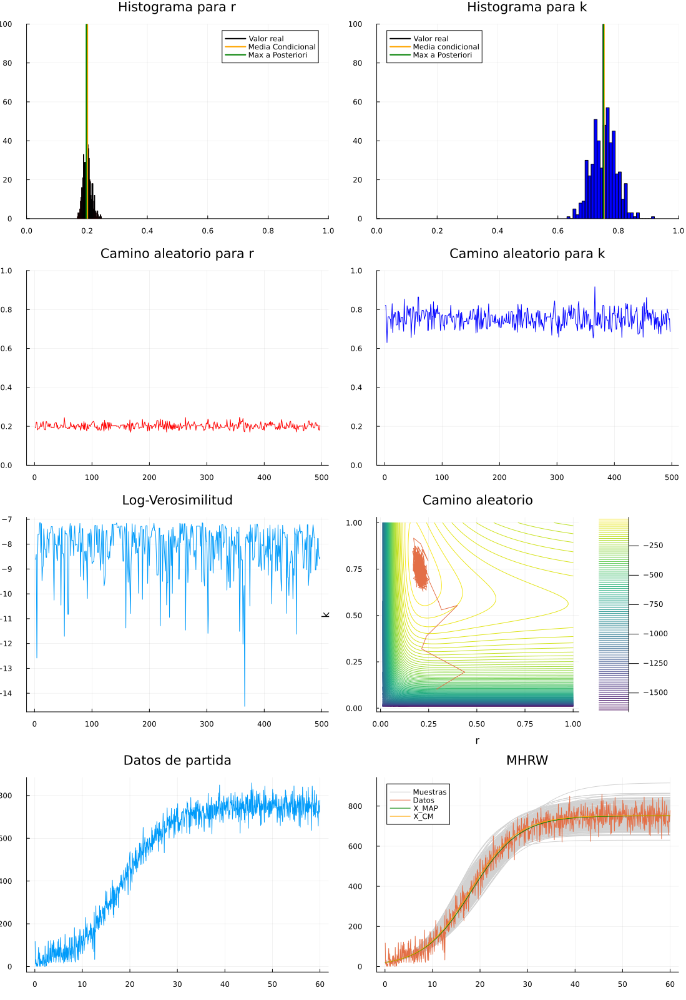

In [8]:
p1 = histogram(samplesED_ss[1,:],bins=50,label=false,color="red",xlim=(0,1),title="Histograma para r")
p1 = plot!([r0, r0], [0,100],linewidth=2,color="black", label="Valor real")
p1 = plot!([MeanED[1], MeanED[1]], [0,100],linewidth=2,color="orange", label="Media Condicional")
p1 = plot!([Max_likelihoodED[1], Max_likelihoodED[1]], [0,100],linewidth=2,color="green", label="Max a Posteriori")

p2 = histogram(samplesED_ss[2,:],bins=50,label=false,color="blue",xlim=(0,1),title="Histograma para k")
p2 = plot!([K0/10^3, K0/10^3],[0,100],linewidth=2, lcolor="black", label="Valor real")
p2 = plot!([MeanED[2], MeanED[2]], [0,100],linewidth=2,color="orange", label="Media condicional")
p2 = plot!([Max_likelihoodED[2], Max_likelihoodED[2]], [0,100],linewidth=2,color="green", label="Max a Posteriori")

p3 = plot(samplesED_ss[1,:],color="red",label = false,title="Camino aleatorio para r",ylim=(0,1))

p4 = plot(samplesED_ss[2,:],color="blue",label = false,title="Camino aleatorio para k",ylim=(0,1))

p5 = plot(log.(probabilitiesED_ss), label=false , title="Log-Verosimilitud")

p6 = contour(x_range, y_range, z_values, levels=100, color=:viridis, xlabel="r", ylabel="k",title="Camino aleatorio")
p6 = plot!(samplesED[1,:],samplesED[2,:],label=false)

p7 = plot(Tiempo, Crecimiento,label=false, title = "Datos de partida")

p8 = plot(Tiempo,soln_expl((samplesED_ss[:,size(samplesED_ss)[2]][1],1000*samplesED_ss[:,size(samplesED_ss)[2]][2])),
    color="gray82",title="MHRW",label="Muestras",z=1,size=(1000, 600))
for j=1:(size(samplesED_ss)[2]-1)
   p8 = plot!(Tiempo,soln_expl((1*samplesED_ss[:,j][1],1000*samplesED_ss[:,j][2])),color="gray82",label=false,z=1)
end
p8 = plot!(Tiempo, Crecimiento,label="Datos")
p8 = plot!(Tiempo, soln_expl((Max_likelihoodED[1],1000*Max_likelihoodED[2])),color="green",label="X_MAP")
p8 = plot!(Tiempo, soln_expl((MeanED[1],1000*MeanED[2])),color="orange",label="X_CM")


plot(p1,p2,p3,p4,p5,p6,p7,p8, layout=(4,2),size=(1100,1600))

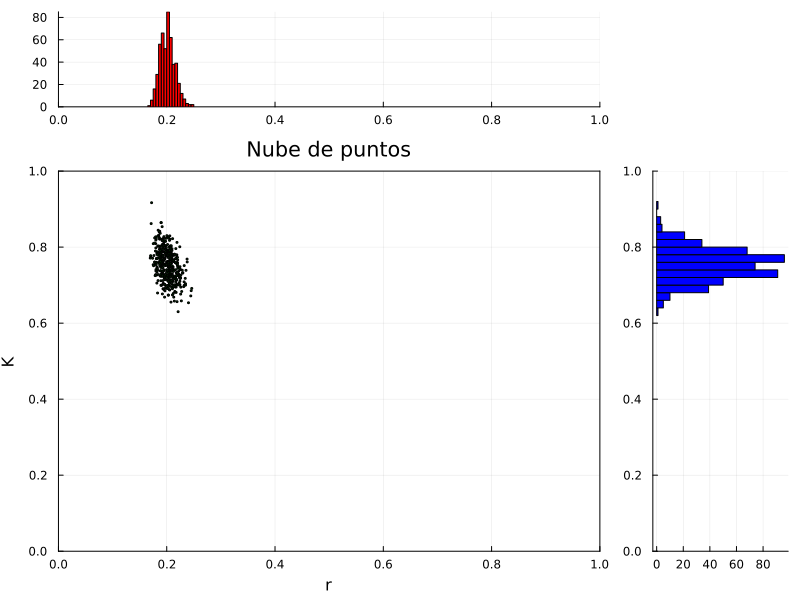

In [9]:
rhist = samplesED_ss[1, :]
khist = samplesED_ss[2, :]
sxy = scatter(rhist, khist, markersize=1, title="Nube de puntos", color="green",
    xlabel="r", ylabel="K", border=:box,xlims=(0, 1),ylims=(0,1))
hx = histogram(rhist,color="red",xlims=(0, 1))
hy = histogram(khist, orientation=:horizontal,ylims=(0, 1),color="blue")
p0 = Plots.Plot()
cuadricula = grid(2,2, heights=(0.2,0.8), widths=(0.8,0.2))
plot(hx, p0, sxy, hy, legend=:none, layout=cuadricula,size=(800,600))